In [1]:
%config InlineBackend.figure_format = 'retina'

In [2]:
import matplotlib as mpl
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import polars as pl
import seaborn as sns


import cmcrameri
import cmocean

In [3]:
from dv_score import io
from dv_score import differentiation as dev
from dv_score.viz import viz, moe_style_context

In [4]:
sns.set_theme(font_scale=1, style="ticks", palette="tab10", context="talk")

# OSN differentiation dataset 
* Extracted differentiating cells from the entire dataset and embeded them with UMAP
* see [INP5_run_pseudotime.py](../scripts/analysis/INP5_run_pseudotime.py) for a sample script for calculating each cell's pseudotime
* see [INP5_eval_OR_expression.py](../scripts/analysis/INP5_eval_OR_expression.py) for code for evaluated each cell's expressed ORs

In [5]:
_, x_pseudotime = dev.load_pseudotime()

cell_cols = [
    "UMAP_1",
    "UMAP_2",
    "new_celltype",
    "Dorsal_smooth",
    "Ventral_smooth",
    "DV_smooth",
    "weighted_dv"
]
df_obs = io.load_development("cell_obs", cols=cell_cols)
xu, yu = df_obs[["UMAP_1", "UMAP_2"]].values.T

olfr_cols = [
    "n_OR_1",
    "n_OR_3",
    "olfr_max",
    "ventral_class2_max_smooth",
    "dorsal_class2_max_smooth",
    "class1_max_smooth",
    "olfr_sum"
]
df_olfr = io.load_development("olfr", cols=olfr_cols)

# UMAP plots

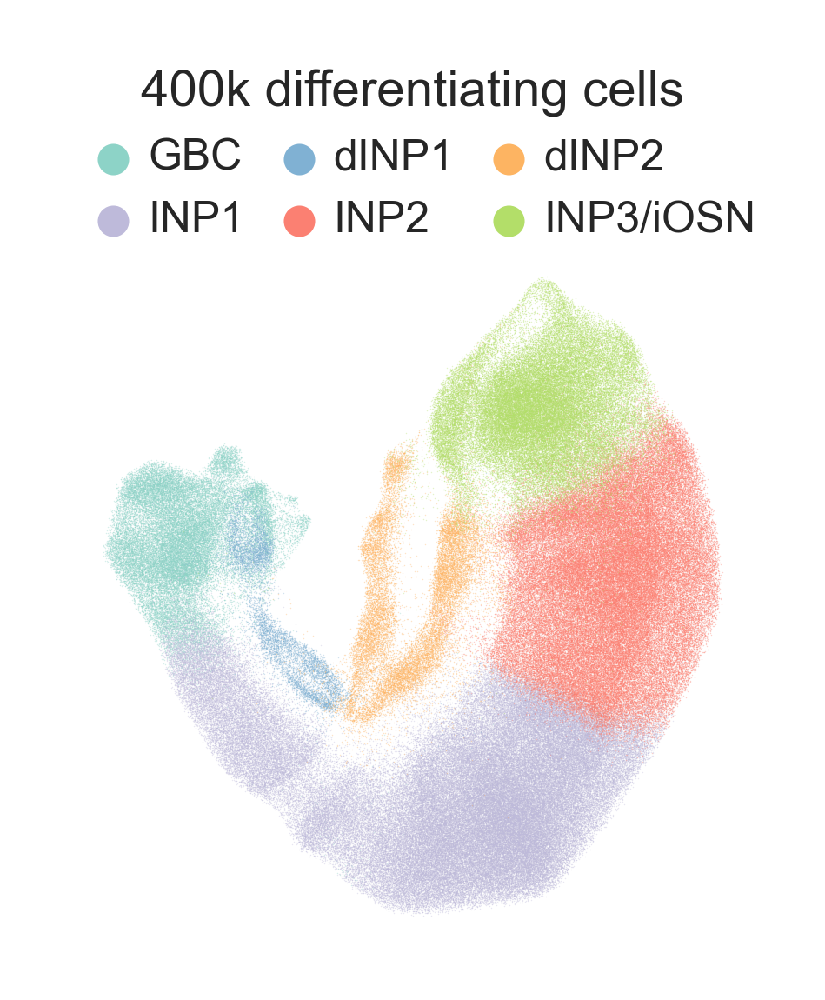

In [6]:
with moe_style_context():
    new_celltype = df_obs.new_celltype.values
    ct = ["GBC", "iOSN", "INP1", "INP2", "dINP1", "dINP2", "INP3"]
    cols = sns.color_palette("Set3", n_colors=len(ct))
    pal_map = dict(zip(ct, cols))
    plot_order = ['GBC', 'INP1', 'dINP1', 'INP2', 'dINP2', 'INP3']

    fig, ax = plt.subplots(figsize=(1.75, 1.75))
    for i, c in enumerate(plot_order):
        if c == "INP3":
            clab = "INP3/iOSN"
        else:
            clab = c
        is_celltype = new_celltype == c
        ax.scatter(
            xu[is_celltype],
            yu[is_celltype],
            lw=0,
            s=0.03,
            alpha=0.35,
            color=pal_map[c],
            rasterized=True,
            label=clab,
        )
        ax.axis("off")
    ax.legend()
    leg = ax.legend(
        loc="lower center",
        bbox_to_anchor=(0.5, 0.95),
        ncols=3,
        columnspacing=0.25,
        markerscale=25,
        handletextpad=-0.2,
        title="400k differentiating cells",
    )
    for lh in leg.legend_handles:
        lh.set_alpha(1)
    ax.set_aspect("equal")

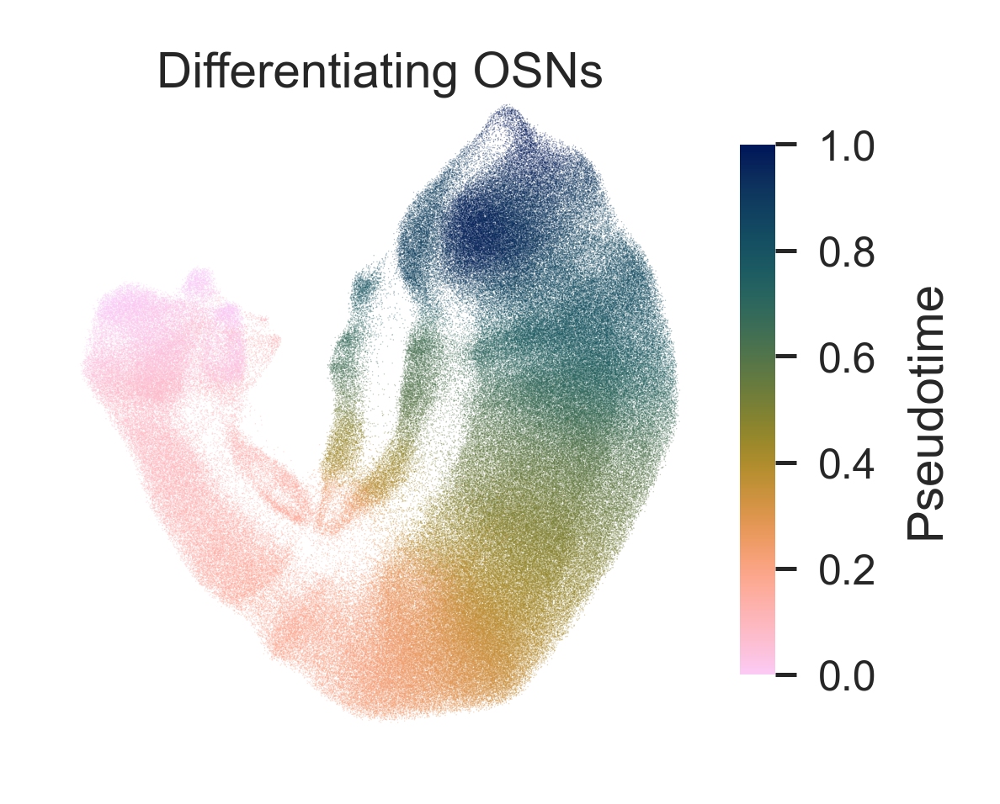

In [7]:
with moe_style_context():
    fig, ax = plt.subplots(figsize=(1.75, 1.75))
    im = ax.scatter(
        xu,
        yu,
        c=x_pseudotime,
        lw=0,
        s=0.03,
        alpha=0.35,
        cmap=cmcrameri.cm.batlow_r,
        rasterized=True,
        vmax=1,
        vmin=0,
    )
    ax.set_aspect("equal")
    ax.axis("off")
    ax.set_title("Differentiating OSNs", y=0.92)
    cbar, cax = viz.add_cbar(im, fig, pos=[0.92, 0.2, 0.04, 0.6])
    cbar.set_label("Pseudotime")
    cax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(0.2))

In [8]:
def plot_col(
    col,
    lims=(0, 30),
    lab=None,
    horz=True,
    adjust_ticks=False,
    fs=(1.75, 1.75),
    add_label=True,
    cmap="cmo.matter",
    xu=xu,
    yu=yu,
):
    if lims is None:
        lims = (0, np.percentile(col, 99.5))
    fig, ax = plt.subplots(figsize=fs)
    im = ax.scatter(
        xu,
        yu,
        c=col,
        s=0.06,
        alpha=0.3,
        vmin=lims[0],
        vmax=lims[1],
        rasterized=True,
        lw=0,
        cmap=cmap,
    )
    ax.axis("off")
    ax.set_aspect("equal")
    if horz:
        cbar, cax = viz.add_horz_cbar(im, fig)
        if adjust_ticks:
            if len(cbar.get_ticks()) < 4:
                cax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(5))
    else:
        cbar, cax = viz.add_cbar(im, fig)
    if add_label:
        cbar.set_label(lab)
    return fig, ax, cax

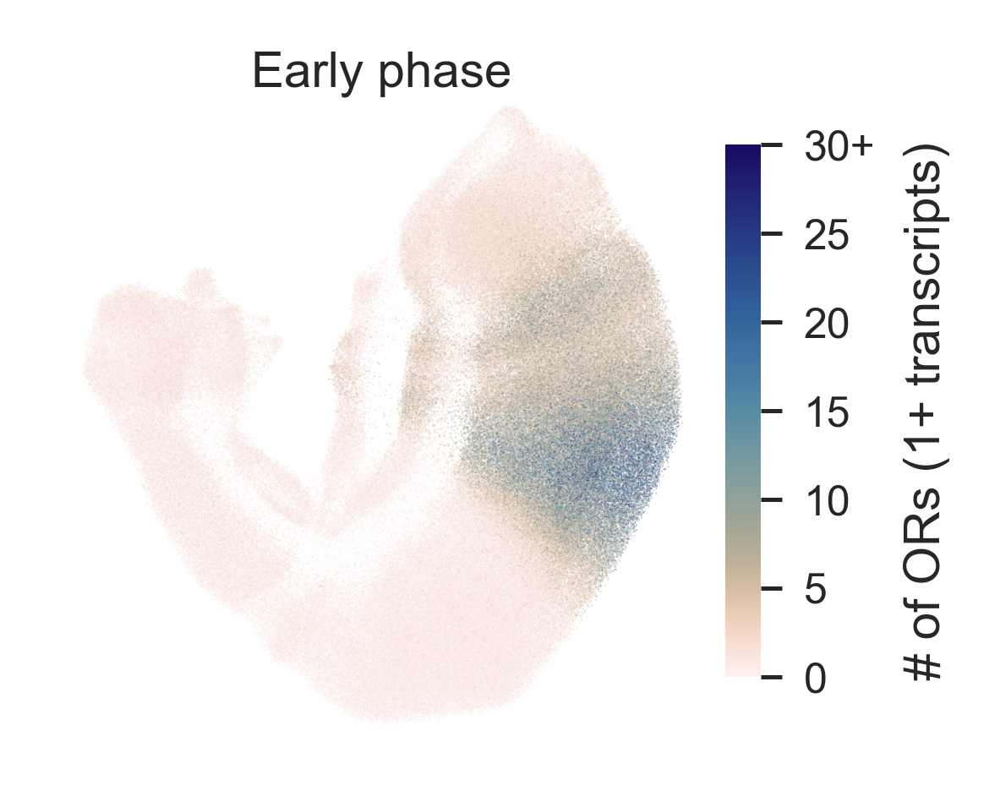

In [9]:
with moe_style_context():
    fig, ax, cax = plot_col(
        df_olfr["n_OR_1"],
        lab=rf"# of ORs (1+ transcripts)",
        horz=False,
        cmap=cmcrameri.cm.lapaz_r,
    )
    xt = cax.get_yticks()
    cax.set_yticks(xt)
    xtl = xt.astype(int).astype(str)
    xtl[-1] = f"{xtl[-1]}+"
    cax.set_yticklabels(xtl)
    ax.set_title("Early phase", y=0.92)

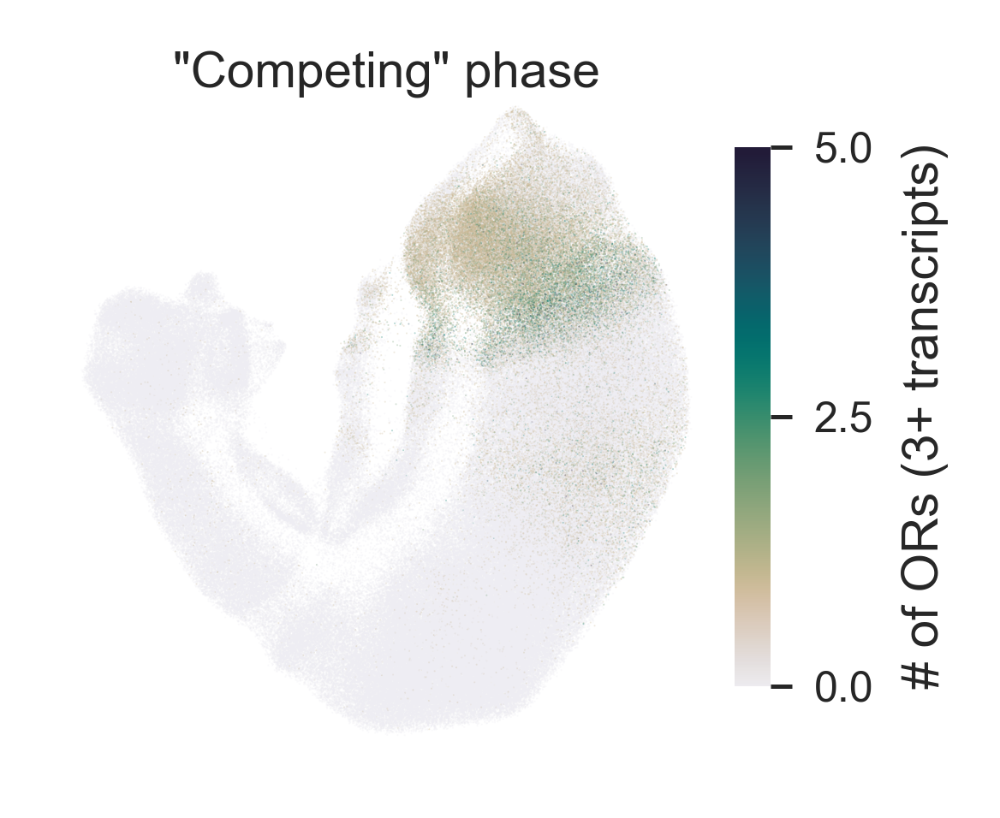

In [10]:
with moe_style_context():
    fig, ax, _ = plot_col(
        df_olfr["n_OR_3"],
        lims=(0, 5),
        lab=f"# of ORs (3+ transcripts)",
        horz=False,
        cmap="cmo.rain",
    )
    ax.set_title('"Competing" phase', y=0.92)

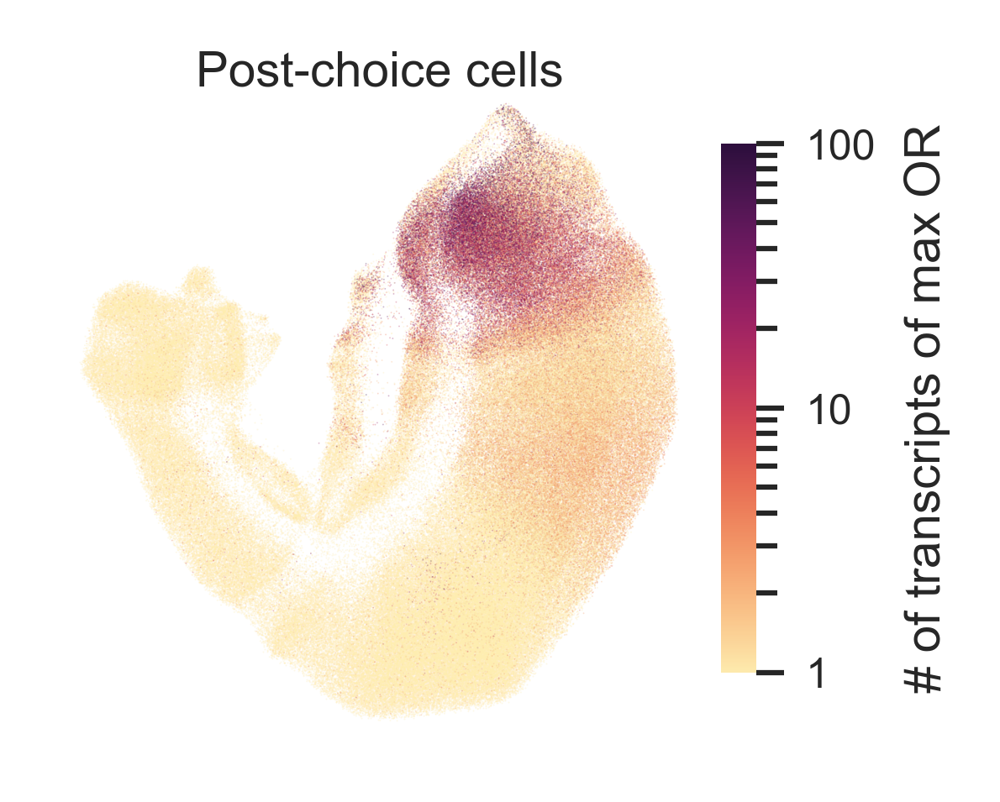

In [11]:
with moe_style_context():
    fig, ax = plt.subplots(figsize=(1.75, 1.75))
    col = df_olfr["olfr_max"]
    is_zero = col == 0
    im = ax.scatter(
        xu[is_zero],
        yu[is_zero],
        color=cmocean.cm.matter(0),
        s=0.05,
        alpha=0.3,
        rasterized=True,
        lw=0,
    )
    im = ax.scatter(
        xu,
        yu,
        c=col,
        s=0.05,
        alpha=0.3,
        norm=mpl.colors.LogNorm(vmin=1, vmax=100),
        rasterized=True,
        lw=0,
        cmap="cmo.matter",
    )
    ax.set_aspect("equal")
    ax.axis("off")
    cbar, cax = viz.add_cbar(im, fig)
    ax.set_title("Post-choice cells", y=0.92)
    cax.set_yticks([1, 10, 100])
    cax.set_yticklabels([1, 10, 100])
    cbar.set_label("# of transcripts of max OR")
    cax.tick_params(length=3, width=0.75, which="minor")
    cax.tick_params(length=4, width=0.75, which="major")

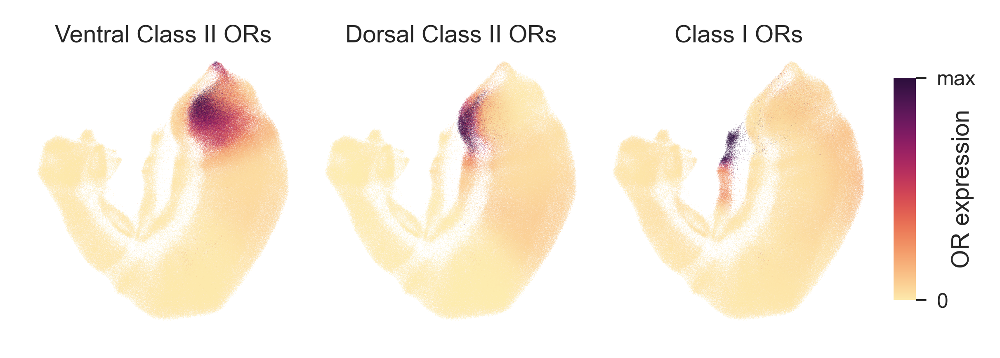

In [12]:
with moe_style_context():
    fig, axes = plt.subplots(1, 3, figsize=(4.5, 1.5), sharex=True, sharey=True)
    cols = ["ventral_class2_max_smooth", "dorsal_class2_max_smooth", "class1_max_smooth"]
    class_order = ["Ventral Class II ORs", "Dorsal Class II ORs", "Class I ORs"]
    for i, (ax, c) in enumerate(zip(axes, cols)):
        col = df_olfr[c]
        vmax = np.percentile(col, 99.5)
        im = ax.scatter(
            xu,
            yu,
            c=col,
            s=0.05,
            alpha=0.3,
            vmin=0,
            vmax=vmax,
            rasterized=True,
            lw=0,
            cmap="cmo.matter",
        )
        ax.set_title(class_order[i], y=0.95)
        ax.axis("off")
        ax.set_aspect("equal")
    plt.subplots_adjust(wspace=0.0)
    cbar, cax = viz.add_cbar(im, fig, pos=[0.91, 0.2, 0.02, 0.6])
    cbar.set_label("OR expression", labelpad=-7)
    cbar.set_ticks([0, vmax])
    cbar.set_ticklabels(["0", "max"])

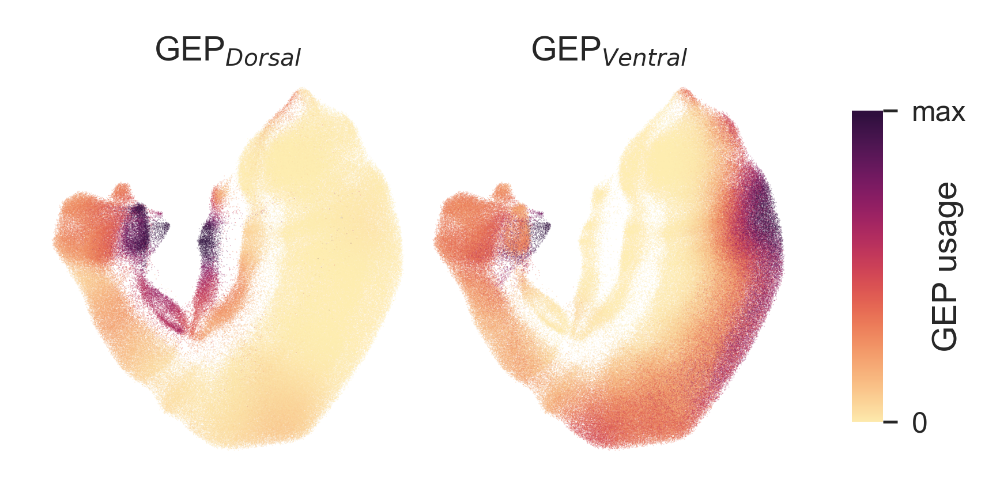

In [13]:
cols = ["Dorsal_smooth", "Ventral_smooth"]
with moe_style_context():
    fig, axes = plt.subplots(1, 2, figsize=(3, 1.5), sharex=True, sharey=True)
    for i, (ax, c) in enumerate(zip(axes, cols)):
        col = df_obs[c]
        vmax = np.percentile(col, 99.5)
        im = ax.scatter(
            xu,
            yu,
            c=col,
            s=0.05,
            alpha=0.3,
            vmin=0,
            vmax=vmax,
            rasterized=True,
            lw=0,
            cmap="cmo.matter",
        )
        g = c.split("_")[0]
        ax.set_title(f"GEP$_{{{g}}}$", y=0.95)
        ax.axis("off")
        ax.set_aspect("equal")
    plt.subplots_adjust(wspace=-0.1)
    cbar, cax = viz.add_cbar(im, fig, pos=[0.93, 0.2, 0.03, 0.6])
    cbar.set_label("GEP usage", labelpad=-7)
    cbar.set_ticks([0, vmax])
    cbar.set_ticklabels(["0", "max"])

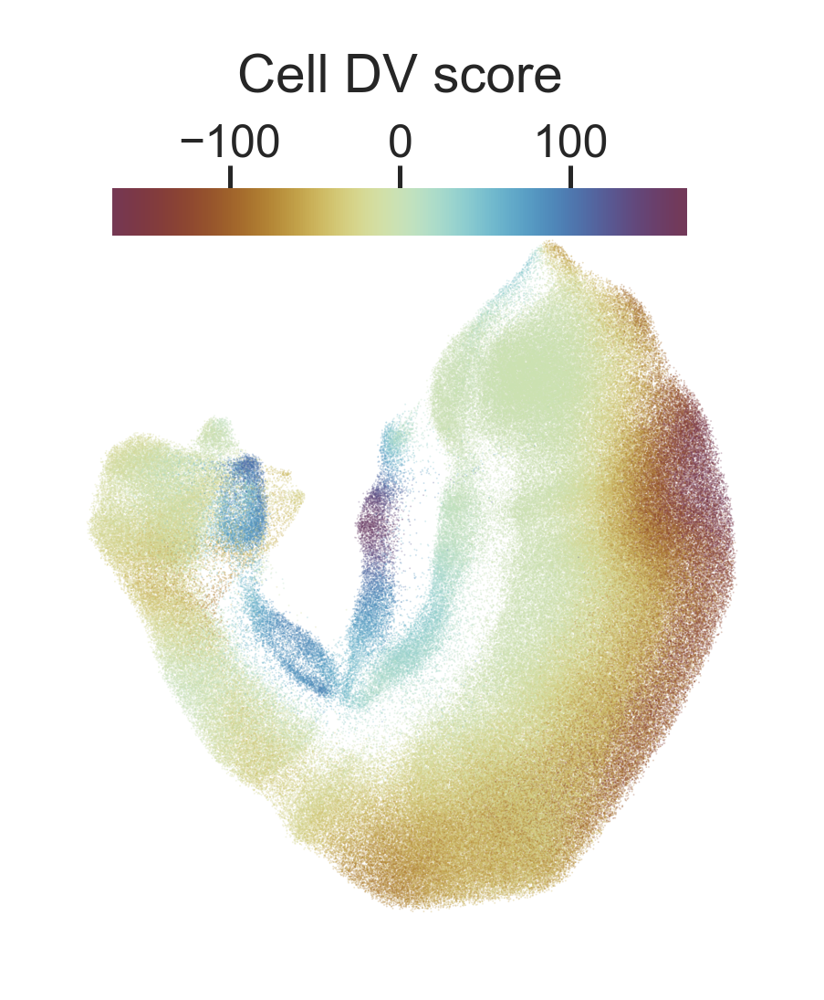

In [14]:
with moe_style_context():
    fig, ax = plt.subplots(figsize=(1.75, 1.75))
    col = df_obs["DV_smooth"]
    vmax = np.percentile(np.abs(col), 99.5)
    im = ax.scatter(
        xu,
        yu,
        c=col,
        s=0.05,
        alpha=0.3,
        vmin=-1 * vmax,
        vmax=vmax,
        rasterized=True,
        lw=0,
        cmap=cmcrameri.cm.romaO,
    )
    ax.set_aspect("equal")
    # ax.set_title(name_order[i], y=0.95)
    ax.axis("off")
    plt.subplots_adjust(wspace=0.0)
    cbar, cax = viz.add_horz_cbar(im, fig)
    cbar.set_label("Cell DV score")

## example genes

In [15]:
inp_example_genes = ["Ascl1", "Neurod1", "Lhx2", "Tex15", "Gap43"]
dv_example_genes = ["Nfia", "Nrp2", "Crabp1"]
df_gene_smooth = io.load_development("cell_obs", cols=inp_example_genes + dv_example_genes)

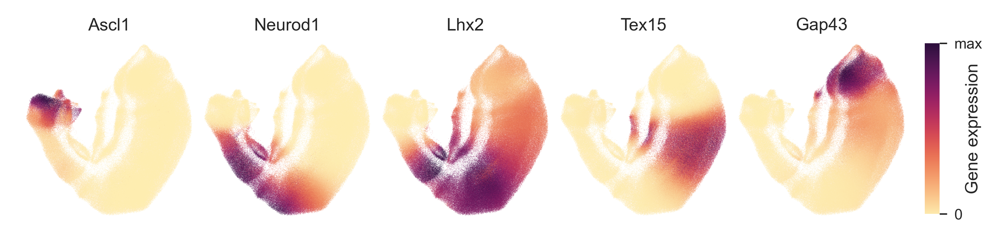

In [16]:
with moe_style_context():
    fig, axes = plt.subplots(1, 5, figsize=(6.5, 1.6), sharex=True, sharey=True)
    for ax, gn in zip(axes, inp_example_genes):
        col = df_gene_smooth[gn]
        vmax = np.percentile(col, 99.5)
        im = ax.scatter(
            xu,
            yu,
            c=col,
            s=0.05,
            alpha=0.3,
            vmin=0,
            vmax=vmax,
            rasterized=True,
            lw=0,
            cmap="cmo.matter",
        )
        ax.axis("off")
        ax.set_title(gn, y=0.95)
        ax.set_aspect("equal")
    plt.subplots_adjust(wspace=-0.025, hspace=0.15)
    cbar, _ = viz.add_cbar(im, fig, pos=[0.91, 0.2, 0.013, 0.6])
    cbar.set_ticks([0, vmax])
    cbar.set_ticklabels(["0", "max"])
    cbar.set_label("Gene expression", labelpad=-7)

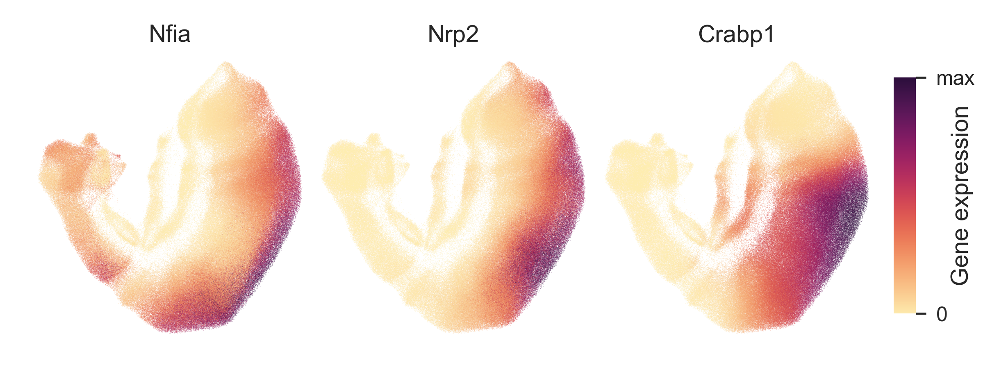

In [17]:
with moe_style_context():
    fig, axes = plt.subplots(1, 3, figsize=(4.5, 1.6), sharex=True, sharey=True)
    for ax, gn in zip(axes, dv_example_genes):
        col = df_gene_smooth[gn]
        vmax = np.percentile(col, 99.5)
        im = ax.scatter(
            xu,
            yu,
            c=col,
            s=0.05,
            alpha=0.3,
            vmin=0,
            vmax=vmax,
            rasterized=True,
            lw=0,
            cmap="cmo.matter",
        )
        ax.axis("off")
        ax.set_title(gn, y=0.95)
        ax.set_aspect("equal")
    plt.subplots_adjust(wspace=-0.025, hspace=0.15)
    cbar, _ = viz.add_cbar(im, fig, pos=[0.91, 0.2, 0.02, 0.6])
    cbar.set_ticks([0, vmax])
    cbar.set_ticklabels(["0", "max"])
    cbar.set_label("Gene expression", labelpad=-7)

## OR expression vs pseudotime

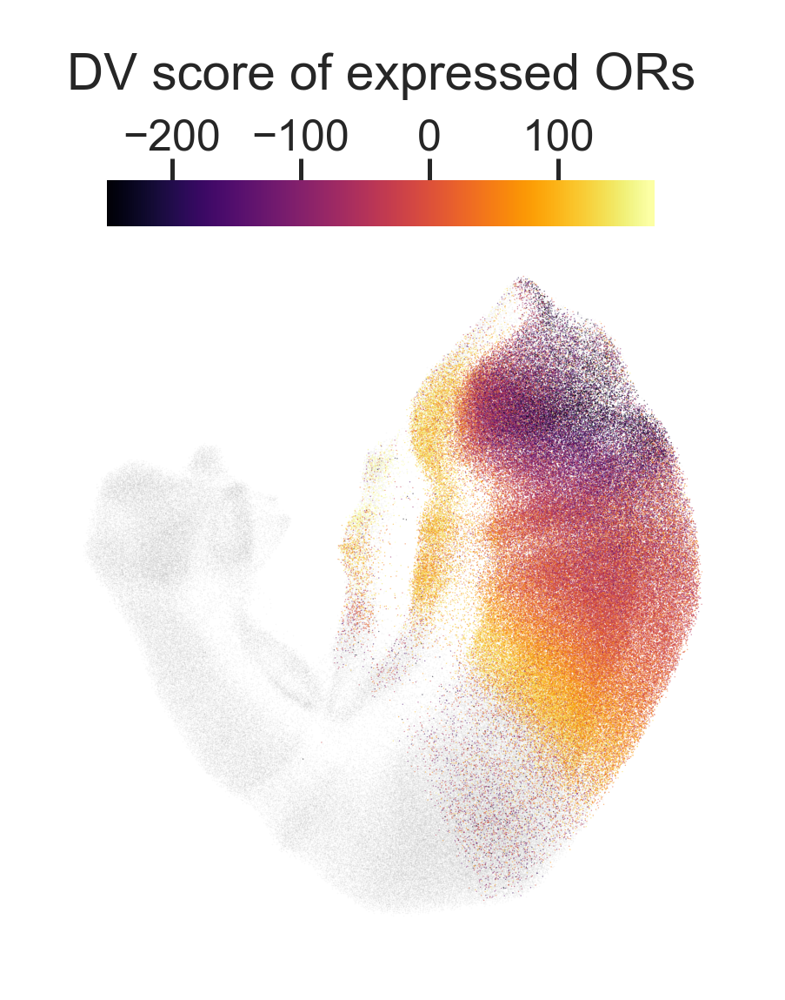

In [18]:
# see `INP5_eval_OR_expression.py`
with moe_style_context():
    fig, ax = plt.subplots(figsize=(1.75, 1.75))
    has_any = (df_olfr.olfr_sum >= 3) & (x_pseudotime > 0.3)
    ax.scatter(
        xu[~has_any], yu[~has_any], c="0.75", s=0.03, lw=0, alpha=0.1, rasterized=True
    )
    im = ax.scatter(
        xu[has_any],
        yu[has_any],
        # DV score of expressed ORs, weighted by OR expression
        c=df_obs["weighted_dv"][has_any],
        s=0.03,
        lw=0,
        alpha=0.5,
        vmin=-250,
        cmap="inferno",
        vmax=175,
        rasterized=True,
    )
    ax.axis("off")
    ax.set_aspect("equal")
    cbar, cax = viz.add_horz_cbar(im, fig, pos=[0.2, 0.9, 0.6, 0.05])
    cbar.set_label("DV score of expressed ORs")
    cax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(100))

In [19]:
# get median pseudotime value for differentiating OSNs expressing class II ORs
df_plot = dev.med_pseudotime()

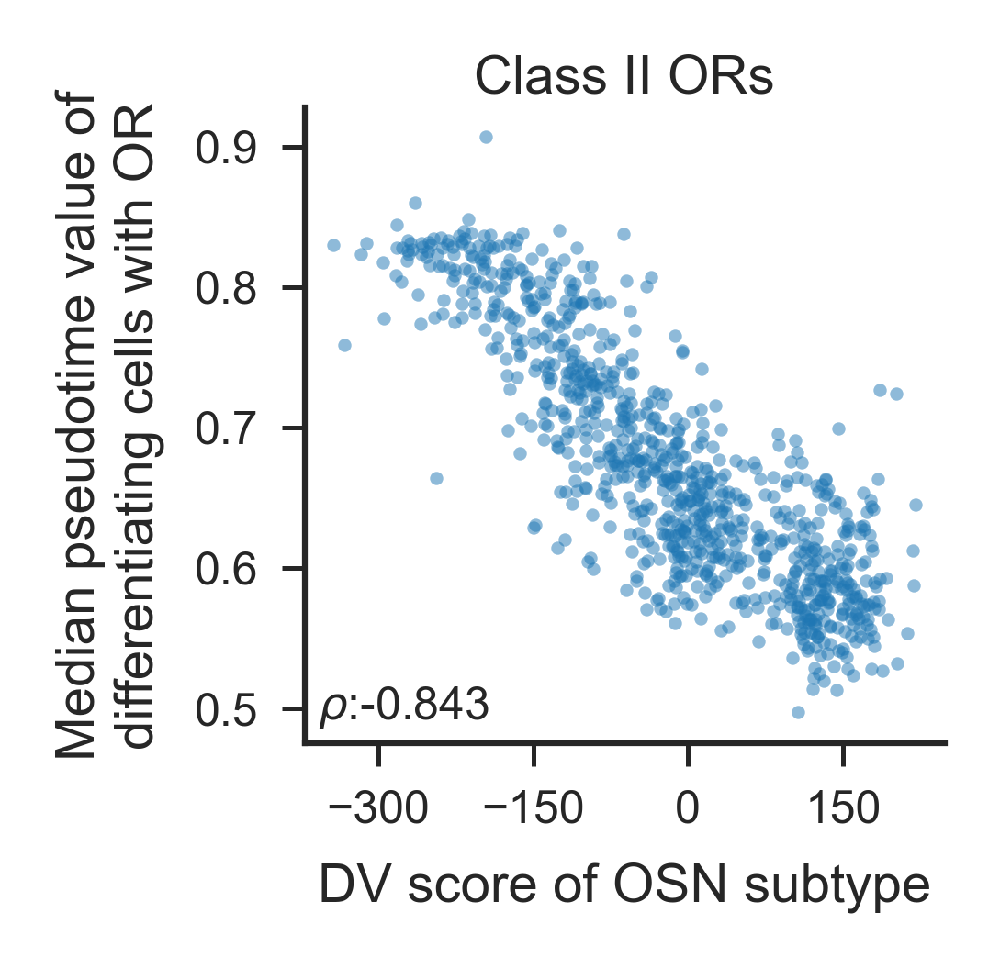

In [20]:
with moe_style_context():
    fig, ax = plt.subplots(1, 1, figsize=(1.5, 1.5), sharey=True)
    ax.scatter(
        df_plot.DV,
        df_plot.med,
        s=3,
        alpha=0.5,
        lw=0,
    )
    viz.plot_r(
        ax,
        df_plot.DV,
        df_plot.med,
        r_loc=(0.02, 0.02),
        ha="left"

    )
    sns.despine()
    ax.set_title(f"Class II ORs", y=0.95)
    ax.set_ylim(0.475, None)
    ax.set_xlabel("DV score of OSN subtype", y=-0.07)
    ax.set_ylabel("Median pseudotime value of\ndifferentiating cells with OR")
    ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(150))
    ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(0.1))

### example ORs

In [21]:
olfr_plot = ["Olfr1513", "Olfr194", "Olfr205", "Olfr1336"]
df_olfr_mat = io.load_development("olfr_mat", cols=olfr_plot)

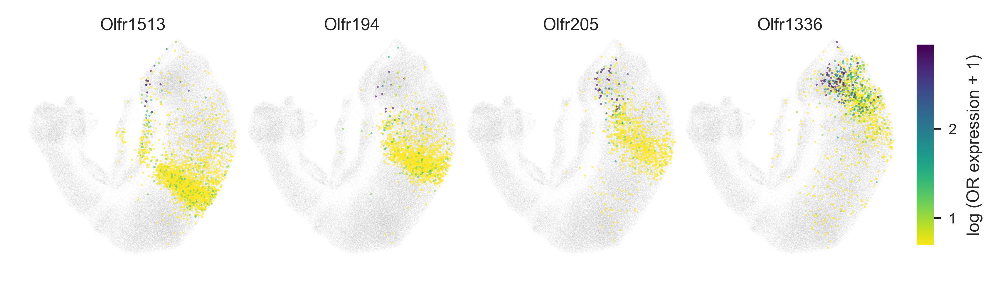

In [22]:
pseudo_dict = {}
with moe_style_context():
    fig, axes = plt.subplots(1, len(olfr_plot), figsize=(6.5, 1.9))
    _c = df_olfr_mat[olfr_plot][(x_pseudotime > 0.3)].values.flatten()
    _c = _c[_c > 0]
    vmax = np.percentile(np.log1p(_c), 99)
    vmin = np.percentile(np.log1p(_c), 1)
    for olfr, ax in zip(olfr_plot, axes):
        ax.scatter(xu, yu, c="0.75", s=0.03, lw=0, alpha=0.1, rasterized=True)
        vals = df_olfr_mat[olfr].values
        has_val = (vals > 0) & (x_pseudotime > 0.3)
        log_val = np.log1p(vals[has_val])
        pseudo_dict[olfr] = pd.Series(x_pseudotime[has_val])
        im = ax.scatter(
            xu[has_val],
            yu[has_val],
            s=0.75,
            c=log_val,
            cmap="viridis_r",
            lw=0,
            alpha=0.6,
            vmax=vmax,
            vmin=vmin,
            rasterized=True
        )
        ax.axis("off")
        ax.set_aspect("equal")
        ax.set_title(olfr, y=0.93)
    plt.subplots_adjust(wspace=-0.05)

    cax = fig.add_axes([0.91, 0.2, 0.015, 0.6])
    cbar = plt.colorbar(im, cax=cax)
    viz.update_cbar(cbar)
    cbar.set_label("log (OR expression + 1)")


In [23]:
df_subset = (
    io.load_df_dv(apply_filter=False)
    .filter(pl.col("top_Olfr").is_in(olfr_plot))
    .sort(["mouse", "cell"])
    .to_pandas()
)

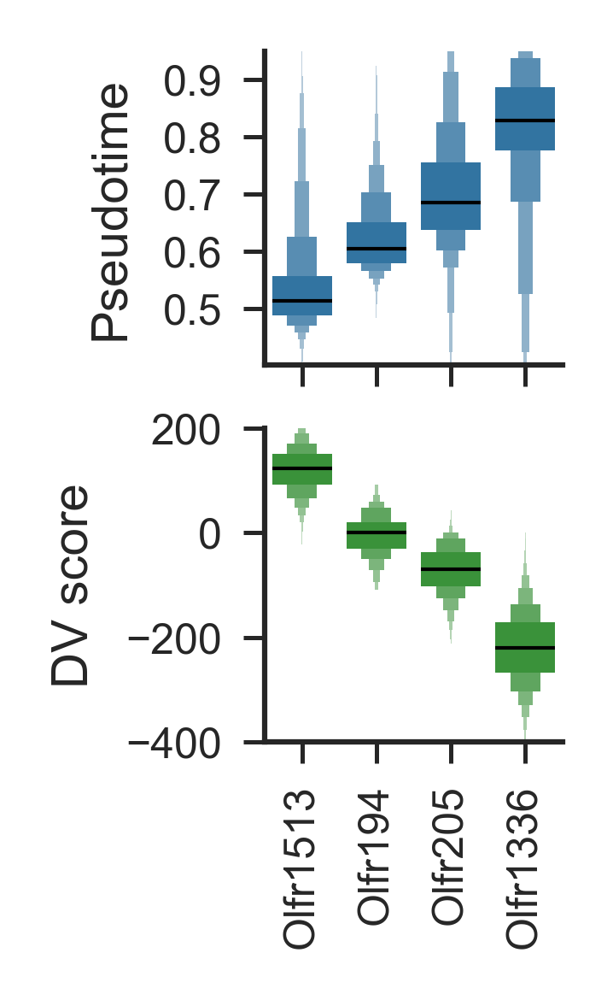

In [24]:
with moe_style_context():
    fig, axes = plt.subplots(2, 1, figsize=(0.75, 1.75), sharex=True)
    ax = axes[0]
    sns.boxenplot(
        data=pd.concat(pseudo_dict).reset_index(),
        x="level_0",
        y=0,
        order=olfr_plot,
        ax=ax,
        linewidth=0.75,
        color=plt.cm.tab10(0),
    )

    ax1 = axes[1]

    sns.boxenplot(
        data=df_subset, x="top_Olfr", y="DV", order=olfr_plot, ax=ax1, linewidth=0.75, color=plt.cm.tab10(2)
    )
    for ax in axes:
        ax.set_xticks(np.arange(len(olfr_plot)))
        ax.set_xticklabels(olfr_plot, rotation=90)
        ax.set_xlabel(None)
        viz.update_boxen(ax, ls="-")
    sns.despine()
    axes[0].set_ylim(0.401, 0.95)
    axes[1].set_ylim(-400, 200)
    axes[1].yaxis.set_major_locator(mpl.ticker.MultipleLocator(200))
    axes[0].yaxis.set_major_locator(mpl.ticker.MultipleLocator(0.1))
    axes[1].set_ylabel("DV score")
    axes[0].set_ylabel("Pseudotime")